# Neural style transfer. 
  
Rules of the task:
* no late submissions allowed 
* your ipynb file should be openable in Anytask directly (no external links, zip archives, etc.)
* your whole solution will not be graded
    * if github blocks of code are detected (except depth estimation network)
    * if equivalent blocks of code for several students are found (except depth estimation network)

Task consists of the following parts:
* part1 (7 points, if good visualization in part 3): program & train transformer network for fast style transfer [Johnson et al. 2016](https://arxiv.org/pdf/1603.08155.pdf) with minor changes for better performance:
    * replace batch normalization with instance normalization (don't forget that it should use **tunable** coefficients)
    * replace transposed convolutions with scaling and ordinary convolution
* part2 (5 points, if good visualization in part 3): augment it with depth loss like in [Liu et al. 2017](https://users.cs.cf.ac.uk/Yukun.Lai/papers/depth_style_transfer.pdf)
    * you may use any existing pytorch monocular depth estimation network from github and train it until convergence or use pretrained weights (give link to materials you used)
* part 3: visualization of the results (most important, it would show how well you made your models)
    * You should stylize **all** content images from images/contents using **any single style** from images/styles that you like more. So train your model in parts 1,2 to reproduce that particular style.
* optional part: any your ideas about style transfer improvement

In [1]:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [0]:
from collections import namedtuple

import torch
import torch.nn as nn
from torchvision import models
import torch.optim as optim
from torch.optim import Adam
from torch.utils.data import DataLoader
from torchvision import datasets
from torchvision import transforms
from tqdm import tqdm_notebook as tqdm

from PIL import Image
import argparse
import os
import sys
import time
from datetime import datetime
import re
from IPython import display
import numpy as np
from pdb import set_trace as bp

In [0]:
transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(256),
    transforms.ToTensor(),
    #transforms.Lambda(lambda x: x.mul(255))
])

# Part 1 - fast style transfer

### Helpful functions

In [0]:
def gram_matrix(y): # returns matrix of cross products on layer y, divided by (height*weight*#channels)
    # YOUR CODE HERE
    b, c, h, w = y.shape
    result = torch.reshape(y, (b, c, h * w))
    return torch.einsum('bik, bjk -> bij', result, result) / (c * h * w)

def normalize_batch(batch):
    # normalization before input to VGG, using imagenet mean and std. Input should be inside [0,1] interval.
    mean = batch.new_tensor([0.485, 0.456, 0.406]).view(1,-1, 1, 1)  # new tensor with the same dtyp`e and device as batch
    std = batch.new_tensor([0.229, 0.224, 0.225]).view(1,-1, 1, 1)   # .view(1,-1, 1, 1) makes [1,3,1,1] shape of tensor
    return (batch - mean) / std

### Vgg16

In [0]:
class Vgg16(torch.nn.Module):
    def __init__(self, requires_grad=False):
        super(Vgg16, self).__init__()
        vgg_pretrained_features = models.vgg16(pretrained=True).features
        self.slice1 = torch.nn.Sequential()
        self.slice2 = torch.nn.Sequential()
        self.slice3 = torch.nn.Sequential()
        self.slice4 = torch.nn.Sequential()
        for x in range(4):
            self.slice1.add_module(str(x), vgg_pretrained_features[x])
        for x in range(4, 9):
            self.slice2.add_module(str(x), vgg_pretrained_features[x])
        for x in range(9, 16):
            self.slice3.add_module(str(x), vgg_pretrained_features[x])
        for x in range(16, 23):
            self.slice4.add_module(str(x), vgg_pretrained_features[x])
        if not requires_grad:
            for param in self.parameters():
                param.requires_grad = False

    def forward(self, X):
        h = self.slice1(X)
        h_relu1_2 = h
        h = self.slice2(h)
        h_relu2_2 = h
        h = self.slice3(h)
        h_relu3_3 = h
        h = self.slice4(h)
        h_relu4_3 = h
        vgg_outputs = namedtuple("VggOutputs", ['relu1_2', 'relu2_2', 'relu3_3', 'relu4_3'])
        out = vgg_outputs(h_relu1_2, h_relu2_2, h_relu3_3, h_relu4_3)
        return out

### StylizerNet

<img src="real-time-ST.gif">

In [0]:
class ResidualBlock(nn.Module):
    def conv3x3(self, in_channels, out_channels, stride=1):
        return nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=stride)

    def __init__(self, in_channels, out_channels, stride=1):
        super(ResidualBlock, self).__init__()
        self.conv1 = self.conv3x3(in_channels, out_channels, stride)
        self.norm1 = nn.InstanceNorm2d(out_channels, affine=True)
        self.relu = nn.ReLU(inplace=True)
        self.conv2 = self.conv3x3(out_channels, out_channels)
        self.norm2 = nn.InstanceNorm2d(out_channels, affine=True)
        
    def forward(self, x):
        residual = x[:,:, 2:x.shape[2]-2, 2:x.shape[3]-2] # cropping 
        out = self.conv1(x)
        out = self.norm1(out)
        out = self.relu(out)
        out = self.conv2(out)
        out = self.norm2(out)
        out += residual
        return out

class ConvLayer(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, stride=1, isNorm = 1):
        super(ConvLayer, self).__init__()
        self.isNorm = isNorm
        self.pad = nn.ReflectionPad2d(kernel_size // 2)
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size = kernel_size, stride=stride)
        self.norm = nn.InstanceNorm2d(out_channels, affine=True)

    def forward(self, x):
        out = self.pad(x)
        out = self.conv(out)
        if self.isNorm == 1:
            out = self.norm(out)
        return out

class DeconvLayer(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size = 3):
        super(DeconvLayer, self).__init__()
        self.upsample = nn.Upsample(scale_factor = 2, mode = 'nearest')
        self.pad = nn.ReflectionPad2d(kernel_size // 2)
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size = kernel_size)

    def forward(self, x):
        out = self.upsample(x)
        out = self.pad(out)
        out = self.conv(out)
        return out
      
class PostLayer(nn.Module):
    def __init__(self, out_channels):
        super(PostLayer, self).__init__()
        self.norm = nn.InstanceNorm2d(out_channels, affine=True)
        self.relu = nn.ReLU(inplace=True)

    def forward(self, x):
        out = self.norm(x)
        out = self.relu(out)
        return out

In [7]:
"""
class ResidualBlock(nn.Module):
    def conv3x3(self, in_channels, out_channels, stride=1):
        return nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=stride, padding=1)

    def __init__(self, in_channels, out_channels, stride=1):
        super(ResidualBlock, self).__init__()
        self.conv1 = self.conv3x3(in_channels, out_channels, stride)
        self.norm1 = nn.InstanceNorm2d(out_channels, affine=True)
        self.relu = nn.ReLU(inplace=True)
        self.conv2 = self.conv3x3(out_channels, out_channels)
        self.norm2 = nn.InstanceNorm2d(out_channels, affine=True)
        
    def forward(self, x):
        residual = x
        out = self.conv1(x)
        out = self.norm1(out)
        out = self.relu(out)
        out = self.conv2(out)
        out = self.norm2(out)
        out += residual
        return out

class ConvLayer(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, stride=1, isNorm = 1):
        super(ConvLayer, self).__init__()
        self.isNorm = isNorm
        self.pad = nn.ReflectionPad2d(kernel_size // 2)
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size = kernel_size, stride=stride)
        self.norm = nn.InstanceNorm2d(out_channels, affine=True)

    def forward(self, x):
        out = self.pad(x)
        out = self.conv(out)
        if self.isNorm == 1:
            out = self.norm(out)
        return out

class DeconvLayer(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size = 3):
        super(DeconvLayer, self).__init__()
        self.upsample = nn.Upsample(scale_factor = 2, mode = 'nearest')
        self.pad = nn.ReflectionPad2d(kernel_size // 2)
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size = kernel_size)

    def forward(self, x):
        out = self.upsample(x)
        out = self.pad(out)
        out = self.conv(out)
        return out
      
class PostLayer(nn.Module):
    def __init__(self, out_channels):
        super(PostLayer, self).__init__()
        self.norm = nn.InstanceNorm2d(out_channels, affine=True)
        self.relu = nn.ReLU(inplace=True)

    def forward(self, x):
        out = self.norm(x)
        out = self.relu(out)
        return out
"""

"\nclass ResidualBlock(nn.Module):\n    def conv3x3(self, in_channels, out_channels, stride=1):\n        return nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=stride, padding=1)\n\n    def __init__(self, in_channels, out_channels, stride=1):\n        super(ResidualBlock, self).__init__()\n        self.conv1 = self.conv3x3(in_channels, out_channels, stride)\n        self.norm1 = nn.InstanceNorm2d(out_channels, affine=True)\n        self.relu = nn.ReLU(inplace=True)\n        self.conv2 = self.conv3x3(out_channels, out_channels)\n        self.norm2 = nn.InstanceNorm2d(out_channels, affine=True)\n        \n    def forward(self, x):\n        residual = x\n        out = self.conv1(x)\n        out = self.norm1(out)\n        out = self.relu(out)\n        out = self.conv2(out)\n        out = self.norm2(out)\n        out += residual\n        return out\n\nclass ConvLayer(nn.Module):\n    def __init__(self, in_channels, out_channels, kernel_size, stride=1, isNorm = 1):\n        super(

In [0]:
class StylizerNet(torch.nn.Module):
    '''Here you should realize Image Transform Net - fig.2 from https://arxiv.org/pdf/1603.08155.pdf
    Its structure should be from https://cs.stanford.edu/people/jcjohns/papers/fast-style/fast-style-supp.pdf
    with 2 modifications: 
    [DONE] 1) batch normalizations should be substituted by instance normalizations with learnable parameters.
    See https://arxiv.org/pdf/1607.08022.pdf
    [DONE] 2) Transposed convolutions with stride 1/2 should be replaced by UpsampleConvLayer, which:
        [DONE] a) upsamples image 2 times with nearest neighbour estimation - use torch.nn.Upsample
        [DONE] b) performs reflection padding with pad=conv_kernel_size // 2
        [DONE] c) applies conv with 3x3 kernel
    This method gives better results compared to ConvTranspose2d, see 
    http://distill.pub/2016/deconv-checkerboard/.
    
    Hint: use torch.nn.InstanceNorm2d with _trainable_ parameters mu, sigma
    '''

    # YOUR CODE HERE
    def __init__(self):
        super(StylizerNet, self).__init__()
        self.conv = nn.Sequential(
            ConvLayer(in_channels = 3, out_channels = 32, kernel_size = 9),
            nn.ReLU(),
            ConvLayer(in_channels = 32, out_channels = 64, kernel_size = 3, stride = 2),
            nn.ReLU(),
            ConvLayer(in_channels = 64, out_channels = 128, kernel_size = 3, stride = 2),
            nn.ReLU()
        )
        
        self.ResBlock1 = ResidualBlock(128, 128)
        self.ResBlock2 = ResidualBlock(128, 128)
        self.ResBlock3 = ResidualBlock(128, 128)
        self.ResBlock4 = ResidualBlock(128, 128)
        self.ResBlock5 = ResidualBlock(128, 128)
        
        self.deconv1 = DeconvLayer(128, 64)
        self.post1 = PostLayer(64)
        self.deconv2 = DeconvLayer(64, 32)
        self.post2 = PostLayer(32)
        self.deconv3 = ConvLayer(in_channels = 32, out_channels = 3, kernel_size = 9, isNorm = 0)
        
        self.pad40 = nn.ReflectionPad2d(40)

    def forward(self, x):

        y = self.pad40(x)
        
        y = self.conv(y)
        
        y = self.ResBlock1(y)
        y = self.ResBlock2(y)
        y = self.ResBlock3(y)
        y = self.ResBlock4(y)
        y = self.ResBlock5(y)

        y = self.deconv1(y)
        y = self.post1(y)
        y = self.deconv2(y)
        y = self.post2(y)
        y = self.deconv3(y)
        return y
      


In [12]:
x = torch.rand((1, 3, 256, 256))
style = StylizerNet()
x = style(x)
print(x.shape)

torch.Size([1, 3, 256, 256])


In [13]:
!wget http://images.cocodataset.org/zips/val2017.zip

--2019-10-27 07:59:05--  http://images.cocodataset.org/zips/val2017.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 52.216.184.243
Connecting to images.cocodataset.org (images.cocodataset.org)|52.216.184.243|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 815585330 (778M) [application/zip]
Saving to: ‘val2017.zip’

val2017.zip         100%[===================>] 777.80M  77.6MB/s    in 10s     

2019-10-27 07:59:15 (77.7 MB/s) - ‘val2017.zip’ saved [815585330/815585330]



In [0]:
!mkdir dataset

In [15]:
!unzip val2017.zip -d dataset

Archive:  val2017.zip
   creating: dataset/val2017/
 extracting: dataset/val2017/000000212226.jpg  
 extracting: dataset/val2017/000000231527.jpg  
 extracting: dataset/val2017/000000578922.jpg  
 extracting: dataset/val2017/000000062808.jpg  
 extracting: dataset/val2017/000000119038.jpg  
 extracting: dataset/val2017/000000114871.jpg  
 extracting: dataset/val2017/000000463918.jpg  
 extracting: dataset/val2017/000000365745.jpg  
 extracting: dataset/val2017/000000320425.jpg  
 extracting: dataset/val2017/000000481404.jpg  
 extracting: dataset/val2017/000000314294.jpg  
 extracting: dataset/val2017/000000335328.jpg  
 extracting: dataset/val2017/000000513688.jpg  
 extracting: dataset/val2017/000000158548.jpg  
 extracting: dataset/val2017/000000132116.jpg  
 extracting: dataset/val2017/000000415238.jpg  
 extracting: dataset/val2017/000000321333.jpg  
 extracting: dataset/val2017/000000081738.jpg  
 extracting: dataset/val2017/000000577584.jpg  
 extracting: dataset/val2017/0000003

In [16]:
!git clone https://github.com/GazizovK/StyleTransferHW

Cloning into 'StyleTransferHW'...
remote: Enumerating objects: 18, done.
remote: Counting objects: 100% (18/18), done.
remote: Compressing objects: 100% (16/16), done.
remote: Total 18 (delta 0), reused 18 (delta 0), pack-reused 0
Unpacking objects: 100% (18/18), done.


In [0]:
transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(256),
    transforms.ToTensor(),
    #transforms.Lambda(lambda x: x.mul(255))
])

In [0]:
dataset = datasets.ImageFolder(root = '/content/dataset', transform=transform)

In [0]:
dataloader = DataLoader(dataset, batch_size=10)

### Training procedure

In [0]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [21]:
ImgTransformNet = StylizerNet().to(device)
VGG = Vgg16().to(device)
MSELoss = nn.MSELoss().to(device)

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:05<00:00, 99.4MB/s]


In [0]:
from torchvision.datasets.folder import default_loader

In [44]:
style_target = default_loader('/content/StyleTransferHW/images/styles/aqua.png')
style_target = transform(style_target)
style_target = style_target.expand(10, style_target.shape[0], 
                                       style_target.shape[1], 
                                       style_target.shape[2])
style_target.shape

torch.Size([10, 3, 256, 256])

In [0]:
style_target = style_target.to(device)

In [0]:
style_target = normalize_batch(style_target)
style_target_vgg = VGG(style_target)

In [0]:
inp = default_loader('/content/StyleTransferHW/images/contents/000000060090.jpg')
inp = transforms.ToTensor()(inp)
inp = inp.expand(1, inp.shape[0], inp.shape[1], inp.shape[2])
inp = inp.to(device)

star = default_loader('/content/StyleTransferHW/images/styles/aqua.png')
star = transform(star)
star = star.expand(1, star.shape[0], star.shape[1], star.shape[2])

In [0]:
def style_loss_MSE(input, target):
    return MSELoss(gram_matrix(input.relu1_2), gram_matrix(target.relu1_2)) \
          + MSELoss(gram_matrix(input.relu2_2), gram_matrix(target.relu2_2)) \
          + MSELoss(gram_matrix(input.relu3_3), gram_matrix(target.relu3_3)) \
          + MSELoss(gram_matrix(input.relu4_3), gram_matrix(target.relu4_3))

def total_var_loss(input):
    total_variation_loss_1 = (input - input.roll(-1, 3))[:,:,:,:input.shape[3] - 1]
    total_variation_loss_2 = (input - input.roll(-1, 2))[:,:,:input.shape[2] - 1,:]

    total_variation_loss_1 = torch.mean(total_variation_loss_1 ** 2)
    total_variation_loss_2 = torch.mean(total_variation_loss_2 ** 2)

    return (total_variation_loss_1 + total_variation_loss_2)
    
def content_loss_MSE(input, target):
    return MSELoss(input.relu3_3, target.relu3_3)     


def train(stylizer, VGG, style_target, epochs = 12):
    
   
    '''Training: refer to lectures for details
    loss function - sum of the 3 losses below: 
    content loss - default mse_loss between relu3_3 representations of vgg class above
    style loss - (sum of default mse_losses)*100000, mse_losses measure deviations of 
                 gramm matrices from their target values
                 for all output representations of vgg class above
    total variation loss: 0.00001*(mean of squared differeces between each pixel and its neighbour from the right+
                                   mean of squared differeces between each pixel and its neighbour from below).
    Content images taken from MS COCO valiadation 2017 dataset: http://cocodataset.org/#download
    You need to train on 60000 images (12 epochs). Each content image should be resized & cropped to 256x256 size. Style size should be original.
    Algorithm-Adam with lr=0.001. Use minibatch learning for speed.
    This is a simplified version of training from https://arxiv.org/pdf/1603.08155.pdf.
    '''

    # YOUR CODE HERE
    content_losses = []
    style_losses = []
    var_losses = []
    stylizer.train()
    optimizer = Adam(stylizer.parameters(), lr=0.001)
    for epoch in range(epochs):  # loop over the dataset multiple times

        running_loss = 0.0
        print(f'====EPOCH {epoch + 1}/{epochs}====')
        for i, data in enumerate(tqdm(dataloader)):

            content_target, _ = data
            # zero the parameter gradients
            torch.cuda.empty_cache()
            optimizer.zero_grad()
            content_target = content_target.to(device)
            
            content_transformed = stylizer(content_target) 
            
            content_transformed = normalize_batch(content_transformed)
            content_transformed_vgg = VGG(content_transformed)
            
            content_target = normalize_batch(content_target)
            content_target_vgg = VGG(content_target)
            content_loss = content_loss_MSE(content_transformed_vgg, content_target_vgg)     
            style_loss = 100000 * style_loss_MSE(content_transformed_vgg, style_target_vgg)
            total_var = 0.00001 * total_var_loss(content_transformed)
            
            loss = content_loss + style_loss + total_var
            
            # print statistics
            if i % 100 == 99:
                content_losses.append(content_loss)
                style_losses.append(style_loss)
                var_losses.append(total_var)
                print('=========')
                print(f'Iteration {i}')
                print(f'content loss item = {content_loss.item()}')
                print(f'style loss item = {style_loss.item()}')
                print(f'var loss = {total_var}')
                print('=========')            
                running_loss += loss.item()
            loss.backward()
            optimizer.step()
        
        print(f'EPOCH {epoch + 1} IS FINISHED WITH LOSS {running_loss}')
        with torch.no_grad():
            plt.figure(figsize = (10, 10))
            pred = stylizer(inp)
            plt.imshow(pred[0].cpu().permute(1, 2, 0))
            plt.show()
            
    print('Finished Training')
    return stylizer, content_losses, style_losses, var_losses
    

====EPOCH 1/12====


Iteration 99
content loss item = 21.261741638183594
style loss item = 37.007835388183594
var loss = 2.9894804356445093e-06
Iteration 199
content loss item = 22.534902572631836
style loss item = 21.236600875854492
var loss = 4.297814939491218e-06
Iteration 299
content loss item = 22.54975700378418
style loss item = 13.931678771972656
var loss = 4.197809175821021e-06
Iteration 399
content loss item = 22.9114990234375
style loss item = 13.425832748413086
var loss = 4.293631718610413e-06
Iteration 499
content loss item = 23.26226043701172
style loss item = 12.292553901672363
var loss = 4.3895188355236314e-06
EPOCH 1 IS FINISHED WITH LOSS 210.4146842956543


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


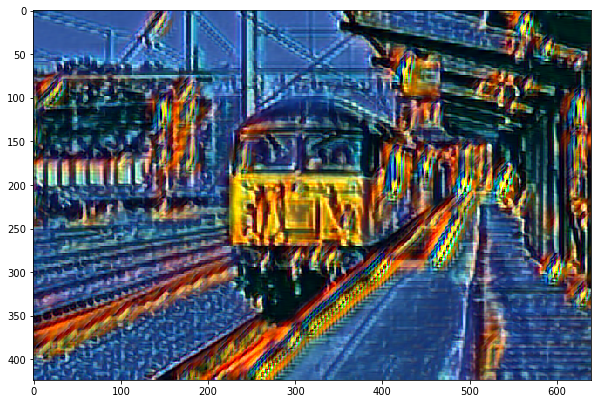

====EPOCH 2/12====


Iteration 99
content loss item = 20.8685245513916
style loss item = 12.240998268127441
var loss = 4.529326815827517e-06
Iteration 199
content loss item = 21.433025360107422
style loss item = 11.400056838989258
var loss = 4.6725381253054366e-06
Iteration 299
content loss item = 21.400440216064453
style loss item = 9.790070533752441
var loss = 4.833090770262061e-06
Iteration 399
content loss item = 21.680627822875977
style loss item = 10.377931594848633
var loss = 4.859284217673121e-06
Iteration 499
content loss item = 21.9854679107666
style loss item = 10.221579551696777
var loss = 4.837319011130603e-06
EPOCH 2 IS FINISHED WITH LOSS 161.39874458312988


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


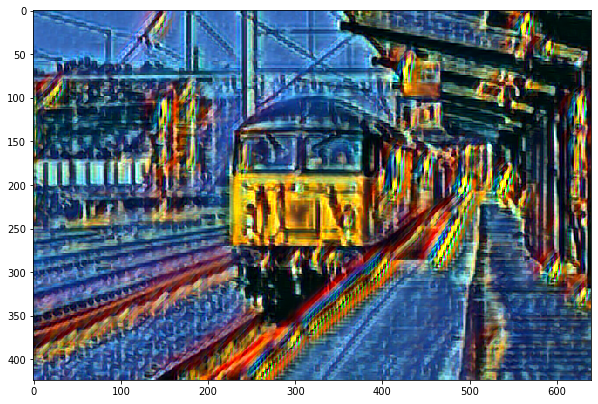

====EPOCH 3/12====


Iteration 99
content loss item = 19.92013168334961
style loss item = 10.52998161315918
var loss = 4.981599431630457e-06
Iteration 199
content loss item = 20.342525482177734
style loss item = 9.68341064453125
var loss = 4.911630185233662e-06
Iteration 299
content loss item = 20.443906784057617
style loss item = 8.729792594909668
var loss = 5.052735559729626e-06
Iteration 399
content loss item = 20.96371841430664
style loss item = 8.714249610900879
var loss = 5.014765065425308e-06
Iteration 499
content loss item = 21.01460838317871
style loss item = 8.955842018127441
var loss = 5.074521141068544e-06
EPOCH 3 IS FINISHED WITH LOSS 149.2981948852539


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


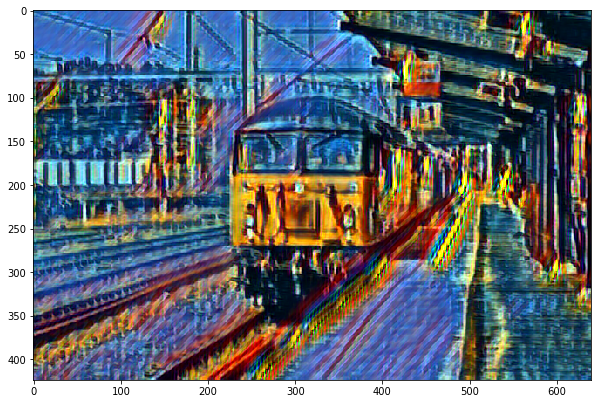

====EPOCH 4/12====


Iteration 99
content loss item = 19.290224075317383
style loss item = 8.975242614746094
var loss = 5.040591986471554e-06
Iteration 199
content loss item = 19.803991317749023
style loss item = 8.310930252075195
var loss = 5.092905212222831e-06
Iteration 299
content loss item = 19.684612274169922
style loss item = 7.868785858154297
var loss = 5.12169344801805e-06
Iteration 399
content loss item = 20.263858795166016
style loss item = 8.292584419250488
var loss = 5.163628429727396e-06
Iteration 499
content loss item = 19.97516632080078
style loss item = 8.687795639038086
var loss = 5.225086169957649e-06
EPOCH 4 IS FINISHED WITH LOSS 141.15321922302246


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


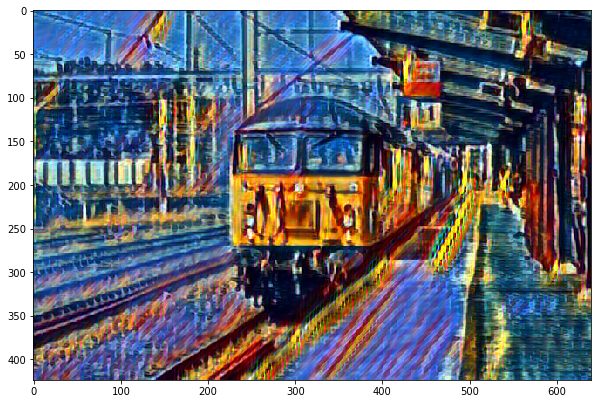

====EPOCH 5/12====


Iteration 99
content loss item = 18.961502075195312
style loss item = 8.18932056427002
var loss = 5.146953753865091e-06
Iteration 199
content loss item = 18.90256690979004
style loss item = 9.695221900939941
var loss = 4.892373453913024e-06
Iteration 299
content loss item = 19.00448226928711
style loss item = 7.476330757141113
var loss = 5.126061296323314e-06
Iteration 399
content loss item = 19.519941329956055
style loss item = 8.574172973632812
var loss = 5.170688382349908e-06
Iteration 499
content loss item = 19.168508529663086
style loss item = 8.588812828063965
var loss = 5.251153652352514e-06
EPOCH 5 IS FINISHED WITH LOSS 138.0808868408203


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


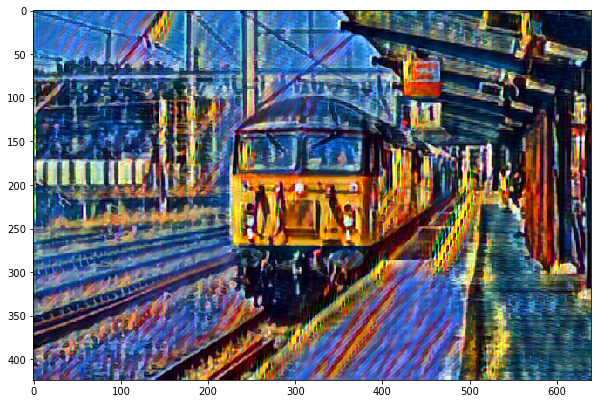

====EPOCH 6/12====


Iteration 99
content loss item = 18.408740997314453
style loss item = 8.370535850524902
var loss = 5.227363544690888e-06
Iteration 199
content loss item = 18.592632293701172
style loss item = 7.485684871673584
var loss = 5.181181222724263e-06
Iteration 299
content loss item = 18.416385650634766
style loss item = 8.971394538879395
var loss = 5.04034869663883e-06
Iteration 399
content loss item = 18.876386642456055
style loss item = 8.3104248046875
var loss = 5.108229288453003e-06
Iteration 499
content loss item = 18.678747177124023
style loss item = 8.250389099121094
var loss = 5.343840712157544e-06
EPOCH 6 IS FINISHED WITH LOSS 134.3613510131836


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


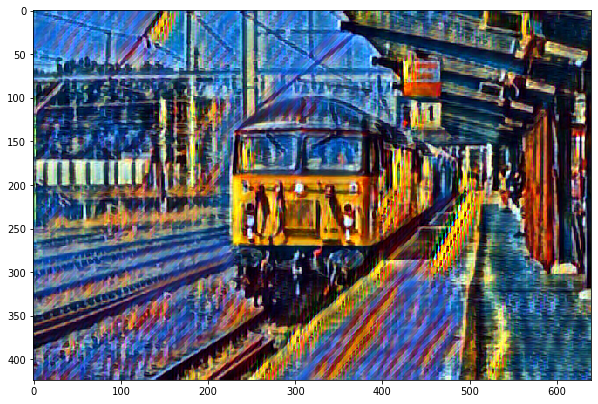

====EPOCH 7/12====


Iteration 99
content loss item = 17.64080047607422
style loss item = 7.805752277374268
var loss = 5.321448952599894e-06
Iteration 199
content loss item = 17.77342987060547
style loss item = 8.455024719238281
var loss = 5.1722900025197305e-06
Iteration 299
content loss item = 17.55579948425293
style loss item = 7.091245651245117
var loss = 5.298390078678494e-06
Iteration 399
content loss item = 18.33734893798828
style loss item = 6.980309963226318
var loss = 5.311456334311515e-06
Iteration 499
content loss item = 18.023906707763672
style loss item = 7.964603900909424
var loss = 5.43551504961215e-06
EPOCH 7 IS FINISHED WITH LOSS 127.62825012207031


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


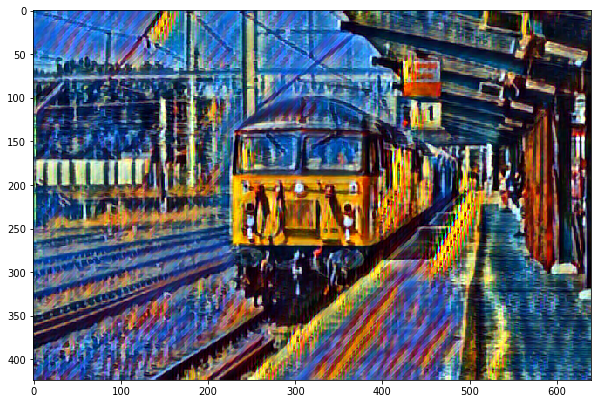

====EPOCH 8/12====


Iteration 99
content loss item = 16.911771774291992
style loss item = 7.616254806518555
var loss = 5.3567746363114566e-06
Iteration 199
content loss item = 17.393972396850586
style loss item = 7.081447124481201
var loss = 5.339225936040748e-06
Iteration 299
content loss item = 17.08697509765625
style loss item = 6.9607415199279785
var loss = 5.25574296261766e-06
Iteration 399
content loss item = 17.870235443115234
style loss item = 7.261519908905029
var loss = 5.2427994887693785e-06
Iteration 499
content loss item = 17.36439323425293
style loss item = 7.8083319664001465
var loss = 5.472171324072406e-06
EPOCH 8 IS FINISHED WITH LOSS 123.35567283630371


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


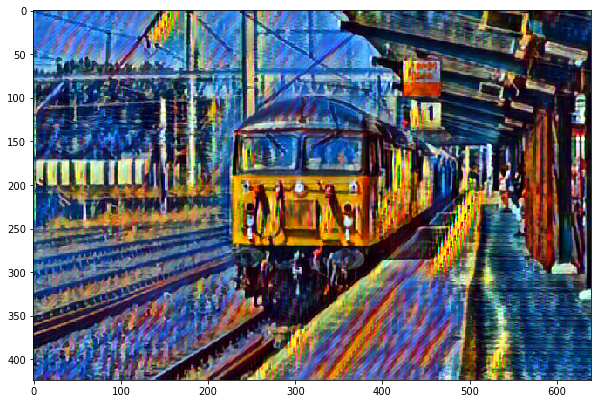

====EPOCH 9/12====


Iteration 99
content loss item = 16.222719192504883
style loss item = 7.455734729766846
var loss = 5.261397745925933e-06
Iteration 199
content loss item = 16.849491119384766
style loss item = 6.643825531005859
var loss = 5.358338967198506e-06
Iteration 299
content loss item = 16.652156829833984
style loss item = 6.637627124786377
var loss = 5.275649073155364e-06
Iteration 399
content loss item = 16.83745002746582
style loss item = 7.4032745361328125
var loss = 5.155358849151526e-06
Iteration 499
content loss item = 17.108455657958984
style loss item = 7.429994583129883
var loss = 5.424627943284577e-06
EPOCH 9 IS FINISHED WITH LOSS 119.24075698852539


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


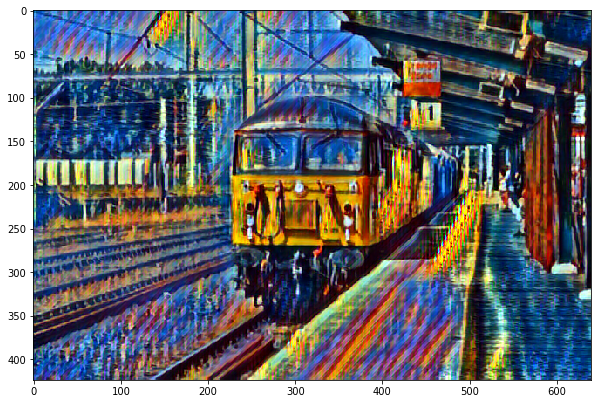

====EPOCH 10/12====


Iteration 99
content loss item = 15.793249130249023
style loss item = 7.610355377197266
var loss = 5.286749001243152e-06
Iteration 199
content loss item = 16.398487091064453
style loss item = 6.650392055511475
var loss = 5.440006134449504e-06
Iteration 299
content loss item = 16.091732025146484
style loss item = 7.124089241027832
var loss = 5.333515673555667e-06
Iteration 399
content loss item = 16.505168914794922
style loss item = 6.8619208335876465
var loss = 5.324356607161462e-06
Iteration 499
content loss item = 16.449695587158203
style loss item = 7.376613140106201
var loss = 5.43266287422739e-06
EPOCH 10 IS FINISHED WITH LOSS 116.86173248291016


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


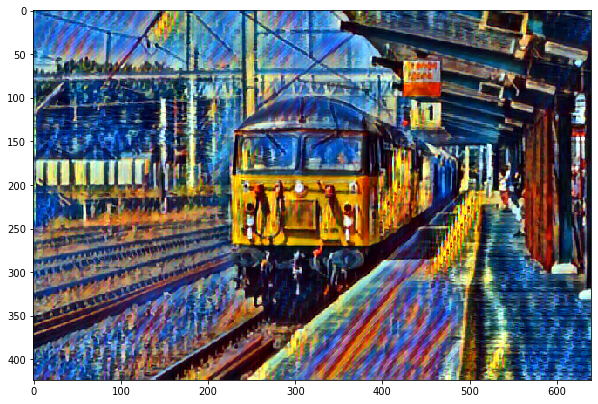

====EPOCH 11/12====


Iteration 99
content loss item = 15.38264274597168
style loss item = 7.349432468414307
var loss = 5.361691364669241e-06
Iteration 199
content loss item = 16.167566299438477
style loss item = 6.230942249298096
var loss = 5.506190973392222e-06
Iteration 299
content loss item = 15.698564529418945
style loss item = 8.827098846435547
var loss = 5.282824076857651e-06
Iteration 399
content loss item = 16.29052734375
style loss item = 6.55422830581665
var loss = 5.382435119827278e-06
Iteration 499
content loss item = 15.981437683105469
style loss item = 7.163361549377441
var loss = 5.39649727215874e-06
EPOCH 11 IS FINISHED WITH LOSS 115.64582824707031


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


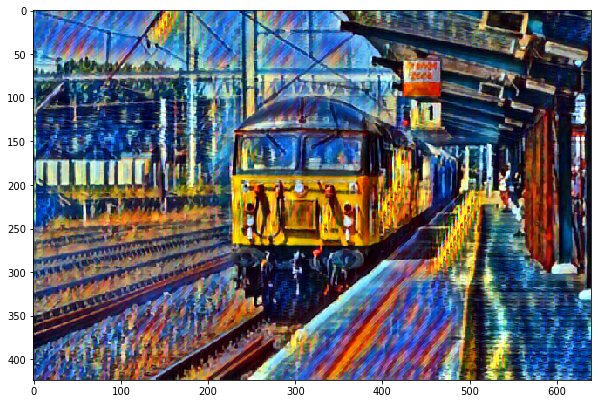

====EPOCH 12/12====


Iteration 99
content loss item = 15.300030708312988
style loss item = 7.017712593078613
var loss = 5.469330517371418e-06
Iteration 199
content loss item = 15.96989631652832
style loss item = 6.12022066116333
var loss = 5.594259164354298e-06
Iteration 299
content loss item = 15.2048978805542
style loss item = 7.061418533325195
var loss = 5.299901658872841e-06
Iteration 399
content loss item = 15.845327377319336
style loss item = 6.52216100692749
var loss = 5.395415882958332e-06
Iteration 499
content loss item = 15.59394645690918
style loss item = 7.031528472900391
var loss = 5.480844720295863e-06
EPOCH 12 IS FINISHED WITH LOSS 111.66716766357422


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


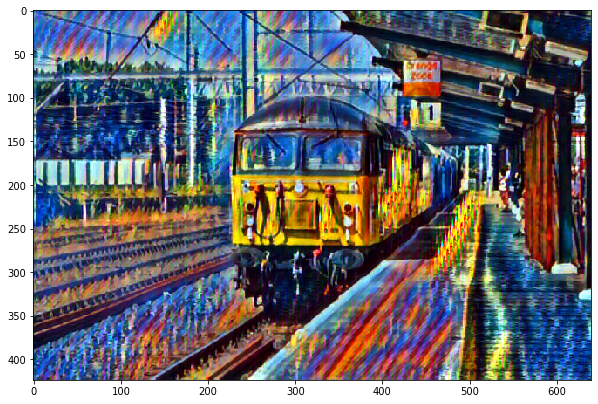

Finished Training
CPU times: user 1h 31min 32s, sys: 1h 30min 47s, total: 3h 2min 20s
Wall time: 3h 2min 54s


In [50]:
%%time
model = train(ImgTransformNet, VGG, style_target, epochs = 12)

In [0]:
inp = default_loader('/content/StyleTransferHW/images/contents/000000060090.jpg')
inp = transforms.ToTensor()(inp)
inp = inp.expand(1, inp.shape[0], inp.shape[1], inp.shape[2])
inp = inp.to(device)

star = default_loader('/content/StyleTransferHW/images/styles/aqua.png')
star = transform(star)
star = star.expand(1, star.shape[0], star.shape[1], star.shape[2])

In [0]:
model[0].eval()
with torch.no_grad():
  pred = model[0](inp)

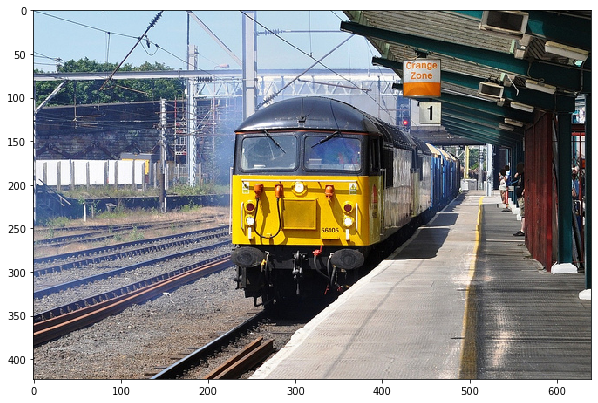

In [53]:
plt.figure(figsize = (10, 10))
plt.imshow(inp[0].cpu().permute(1, 2, 0))

In [0]:
from os import listdir
from os.path import isfile, join
mypath = '/content/StyleTransferHW/images/contents'
onlyfiles = [f for f in listdir(mypath) if isfile(join(mypath, f))]

### Let's look to our  result!
The style is shown below

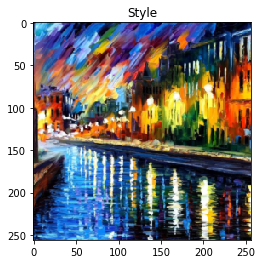

In [67]:
#plt.figure(figsize = (10, 10))
plt.title('Style')
plt.imshow(star[0].cpu().permute(1, 2, 0))
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


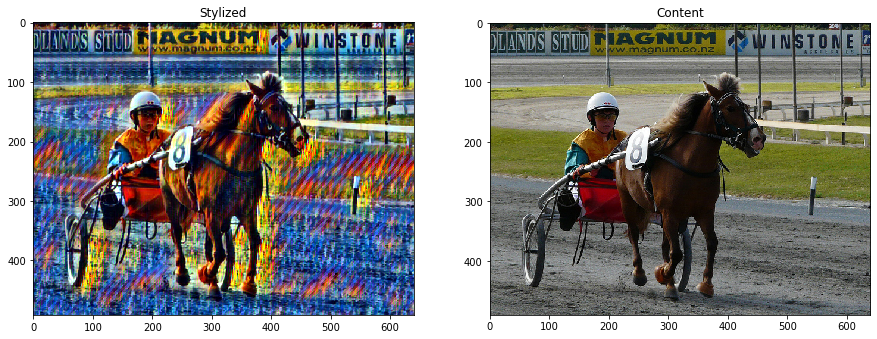

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


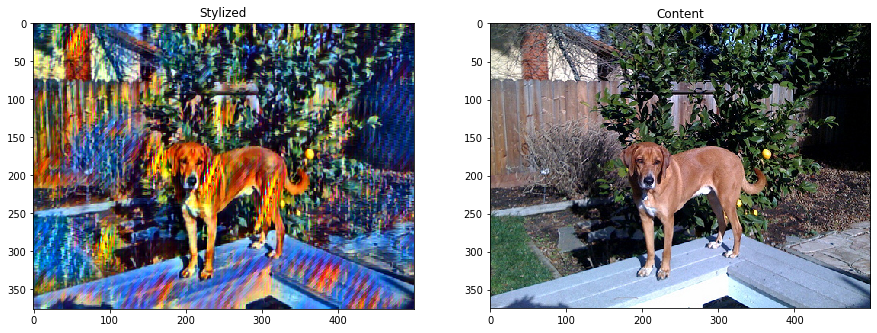

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


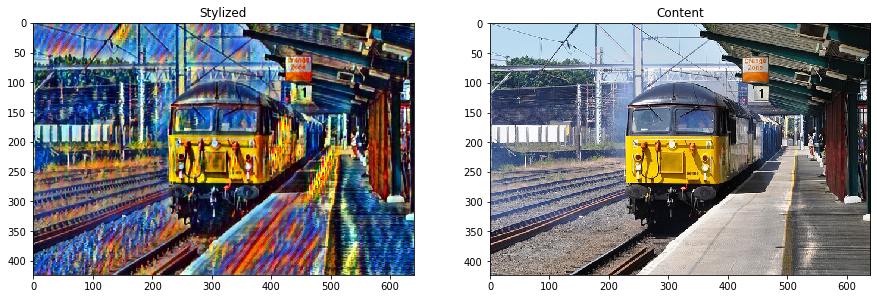

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


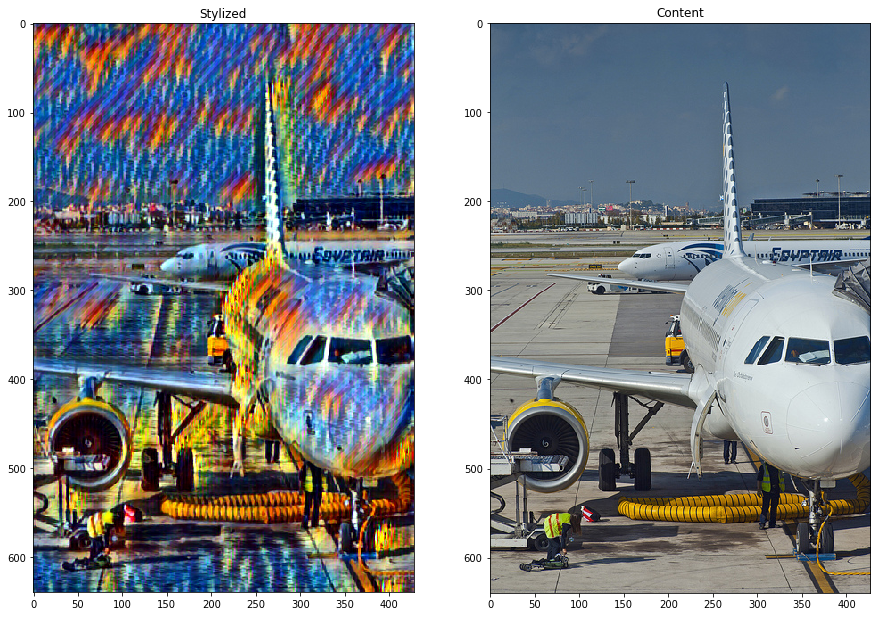

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


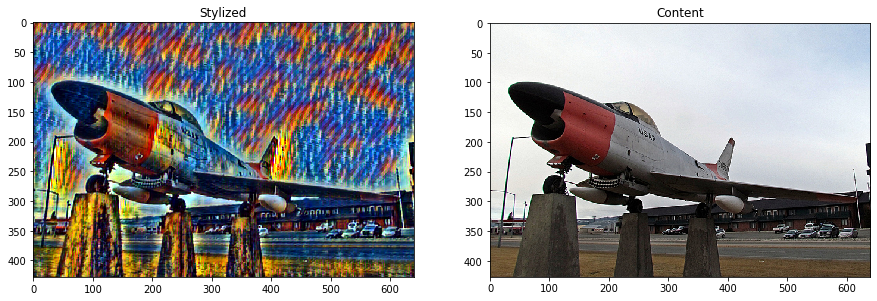

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


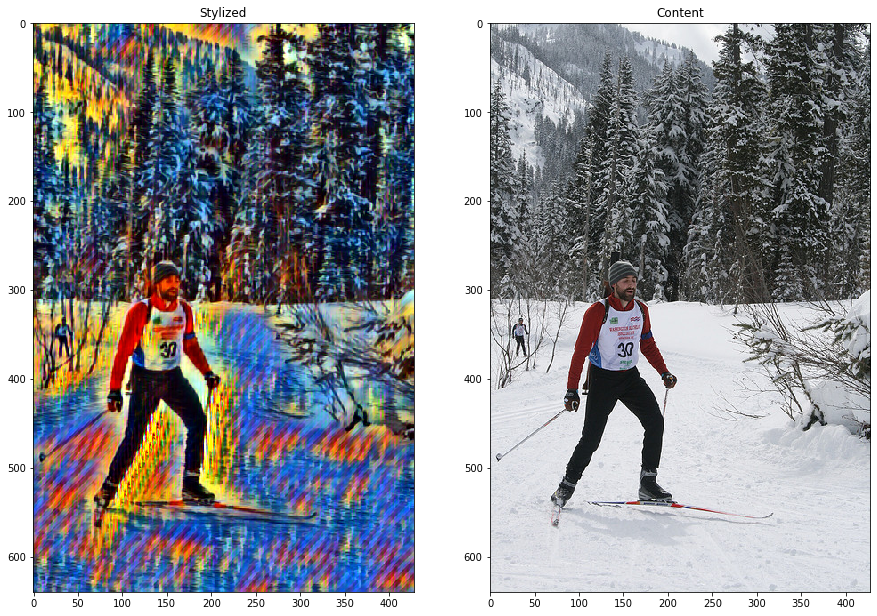

In [64]:
model[0].eval()
with torch.no_grad():
  for path_to_img in onlyfiles:
      inp = default_loader(mypath+'/'+path_to_img)
      inp = transforms.ToTensor()(inp)
      inp = inp.expand(1, inp.shape[0], inp.shape[1], inp.shape[2])
      inp = inp.to(device)

      pred = model[0](inp)
      
      plt.figure(figsize=(15, 15))

      plt.subplot(121)
      plt.title('Stylized')
      plt.imshow(pred[0].cpu().permute(1, 2, 0))

      plt.subplot(122)
      plt.title('Content')
      plt.imshow(inp[0].cpu().permute(1, 2, 0))
      plt.show()

### Our loss functions

Text(0.5, 1.0, 'Total Variation Loss')

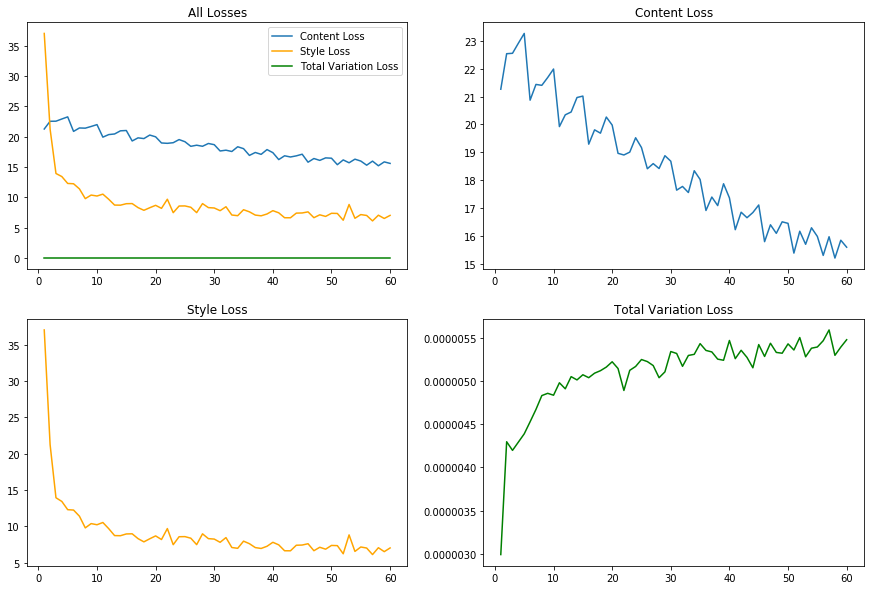

In [98]:
plt.figure(figsize = (15,10))
plt.subplot(221)
plt.plot(np.arange(1, len(model[1]) + 1), model[1], label = 'Content Loss') 
plt.plot(np.arange(1, len(model[2]) + 1), model[2], label = 'Style Loss', color = 'orange')
plt.plot(np.arange(1, len(model[3]) + 1), model[3], label = 'Total Variation Loss',  color = 'g')
plt.legend()
plt.title('All Losses')
plt.subplot(222)
plt.plot(np.arange(1, len(model[1]) + 1), model[1])
plt.title('Content Loss')
plt.subplot(223)
plt.plot(np.arange(1, len(model[2]) + 1), model[2], 'orange')
plt.title('Style Loss')
plt.subplot(224)
plt.plot(np.arange(1, len(model[3]) + 1), model[3], 'g')
plt.title('Total Variation Loss')
#content_losses, style_losses, var_losses

# Part 2 - depth-aware fast style transfer

Augment Gatys loss with depth loss like in [Liu et al. 2017](https://users.cs.cf.ac.uk/Yukun.Lai/papers/depth_style_transfer.pdf)
    * you may use any existing pytorch monocular depth estimation network and train it until convergence or use 
    pretrained weights (give link to model/weights if you used public model/weights)

### Train your model

# Demo part

Visualize selected style image and a grid of 6x3 images I(i,j).
* I(i,1) is content number i from images/contents
* I(i,2) is stylization using depth unaware style transfer
* I(i,3) is stylization using depth aware style transfer

This is the most important part of your homework. Make sure you get 
stylizations of good quality in a convinient to view resolution.

# Optional part
any your ideas (you may write in Russian) on style transfer (any of the models we studied) improvement.